<a href="https://colab.research.google.com/github/duchaba/Data-Augmentation-with-Python/blob/main/data_augmentation_with_python_chapter_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Augmentation with Python, Chapter 4

# 🌻 Welcome to Chapter 4, "Image Augmentation for Segmentation"


In this chapter, we’ll cover the following topics: 

- Geometric and Photometric transformations 

- Real-world segmentation datasets 

- Reinforce learning through Python code   

## Set up: Bring back Pluto

### ✋ STOP: Pull Method

- There are two methods to bring back Pluto.

1. Clone from GitHut (or update by doing "git pull if you have clone it before)

2. Or retrieve from an URL. The URL can be the GitHub URL or an URL the you store your Pluto python file from the first lesson.

- Do one, but not both.



### GitHub Clone

In [2]:
# git version should be 2.17.1 or higher
!git --version

git version 2.17.1


In [3]:
#url = 'https://github.com/PacktPublishing/Data-Augmentation-with-Python'
url = 'https://github.com/duchaba/Data-Augmentation-with-Python'
!git clone {url}

Cloning into 'Data-Augmentation-with-Python'...
remote: Enumerating objects: 152, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 152 (delta 7), reused 18 (delta 7), pack-reused 111
Receiving objects: 100% (152/152), 228.68 MiB | 24.01 MiB/s, done.
Resolving deltas: 100% (56/56), done.


### Fetch file from URL (Optional)

- Uncommend the below 2 code cells if you want to use URL and not Git Clone

In [4]:
# import requests
# #
# def fetch_file(url, dst):
#   downloaded_obj = requests.get(url)
#   with open(dst, "wb") as file:
#     file.write(downloaded_obj.content)
#   return

In [5]:
# url = ''
# dst = 'pluto_chapter_1.py'
# fetch_file(url,dst)

### Pluto

- Instantiate up Pluto, aka. "Pluto, wake up!"

In [6]:
!pip install -Uqq fastai
!pip install albumentations

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
#load and run the pluto chapter 1 Python code.
pluto_file = 'Data-Augmentation-with-Python/pluto/pluto_chapter_3.py'
%run {pluto_file}

---------------------------- : ----------------------------
            Hello from class : <class '__main__.PacktDataAug'> Class: PacktDataAug
                   Code name : Pluto
                   Author is : Duc Haba
---------------------------- : ----------------------------

fastai version (should be 2.6.3 or higher):  2.7.9
---------------------------- : ----------------------------
        albumentations 1.2.1 : actual 1.2.1
---------------------------- : ----------------------------


- Double check on the server environments

In [8]:
pluto.say_sys_info()

---------------------------- : ----------------------------
                 System time : 2022/10/22 04:36
                    Platform : linux
       Python version (3.7+) : 3.7.15 (default, Oct 12 2022, 19:14:55) 
[GCC 7.5.0]
     PyTorch version (1.11+) : 1.12.1+cu113
     Pandas version (1.3.5+) : 1.3.5
        PIL version (9.0.0+) : 7.1.2
 Matplotlib version (3.2.2+) : 3.2.2
                   CPU count : 2
                  *CPU speed : NOT available
---------------------------- : ----------------------------


In [9]:
# !cat {pluto_file}

### ✋ STOP: Reinitalize Kaggle

- Install the following libraries, and import it on the Notebook.
- Follow by initialize Kaggle username, key and fetch methods.
- STOP: Update your Kaggle access username or key first.

In [10]:
# -------------------- : --------------------
# READ ME
# Chapter 2 begin:
# Install the following libraries, and import it on the Notebook.
# Follow by initialize Kaggle username, key and fetch methods.
# STOP: Update your Kaggle access username or key first.
# -------------------- : --------------------

!pip install opendatasets --upgrade
import opendatasets
print("\nrequired version 0.1.22 or higher: ", opendatasets.__version__)

!pip install pyspellchecker 
import spellchecker
print("\nRequired version 0.7+", spellchecker.__version__)

# STOP: Update your Kaggle access username or key first.
pluto.remember_kaggle_access_keys("duchaba", "0c737c90feacb5c56232b0d7c24e8664")
pluto._write_kaggle_credit()
import kaggle

@add_method(PacktDataAug)
def fetch_kaggle_comp_data(self,cname):
  #self._write_kaggle_credit()  # need to run only once.
  path = pathlib.Path(cname)
  kaggle.api.competition_download_cli(str(path))
  zipfile.ZipFile(f'{path}.zip').extractall(path)
  return

@add_method(PacktDataAug)
def fetch_kaggle_dataset(self,url,dest="kaggle"):
  #self._write_kaggle_credit()    # need to run only once.
  opendatasets.download(url,data_dir=dest)
  return
# -------------------- : --------------------


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

required version 0.1.22 or higher:  0.1.22
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.5 MB 12.6 MB/s 

Required version 0.7+ 0.7.0


# Fetch Kaggle Data

## CamVid (Cambridge-Driving Labeled Video Database)

In [11]:
url = 'https://www.kaggle.com/datasets/carlolepelaars/camvid'
pluto.fetch_kaggle_dataset(url)

100%|██████████| 575M/575M [00:09<00:00, 64.5MB/s]


In [12]:
# f = 'kaggle/camvid/CamVid/train/0001TP_009210.png'
# m = 'kaggle/camvid/CamVid/train_labels/0001TP_009210_L.png'
# import PIL
# img = PIL.Image.open(f)
# mask = PIL.Image.open(m)
# display(img)
# display(mask)

In [13]:
# remove white space in directory and filename
# run this until no error/output
f = 'kaggle/camvid/CamVid/train'
!find {f} -name "* *" -type d | rename 's/ /_/g'
#!find {f} -name "* *" -type f | rename 's/ /_/g'

In [14]:
# change method name to make_dir_dframe
pluto.df_camvid = pluto.make_dir_dataframe(f)
pluto.df_camvid.head(3)

,fname,label
0,kaggle/camvid/CamVid/train/0016E5_00630.png,train
1,kaggle/camvid/CamVid/train/Seq05VD_f00660.png,train
2,kaggle/camvid/CamVid/train/Seq05VD_f04500.png,train


In [15]:
# p = pathlib.Path(pluto.df_camvid.fname[0])
# print(p.parent.parent, p.parent.name+'_labels', p.name, p.stem+'_L', p.suffix)

In [16]:
@add_method(PacktDataAug)
def _make_df_mask_name(self,fname):
  p = pathlib.Path(fname)
  return (str(p.parent.parent) + '/' + str(p.parent.name) + '_labels/' + str(p.stem)+'_L' + str(p.suffix))
#
@add_method(PacktDataAug)
def make_df_mask_name(self,df):
  df['mask_name'] = df.fname.apply(self._make_df_mask_name)
  return

In [17]:
# pluto._make_df_mname(pluto.df_camvid.fname[0])

In [18]:
pluto.make_df_mask_name(pluto.df_camvid)
pluto.df_camvid.head()

,fname,label,mask_name
0,kaggle/camvid/CamVid/train/0016E5_00630.png,train,kaggle/camvid/CamVid/train_labels/0016E5_00630_L.png
1,kaggle/camvid/CamVid/train/Seq05VD_f00660.png,train,kaggle/camvid/CamVid/train_labels/Seq05VD_f00660_L.png
2,kaggle/camvid/CamVid/train/Seq05VD_f04500.png,train,kaggle/camvid/CamVid/train_labels/Seq05VD_f04500_L.png
3,kaggle/camvid/CamVid/train/0016E5_07963.png,train,kaggle/camvid/CamVid/train_labels/0016E5_07963_L.png
4,kaggle/camvid/CamVid/train/0016E5_05250.png,train,kaggle/camvid/CamVid/train_labels/0016E5_05250_L.png


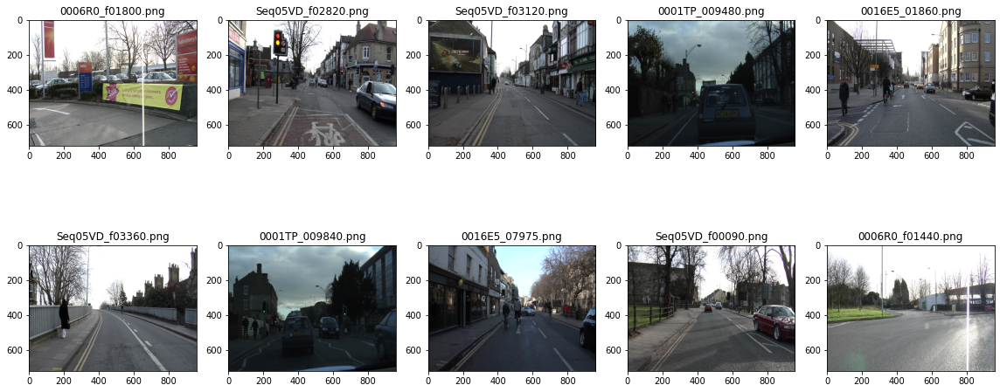

In [19]:
x = pluto.draw_batch(pluto.df_camvid.fname, is_shuffle=True)

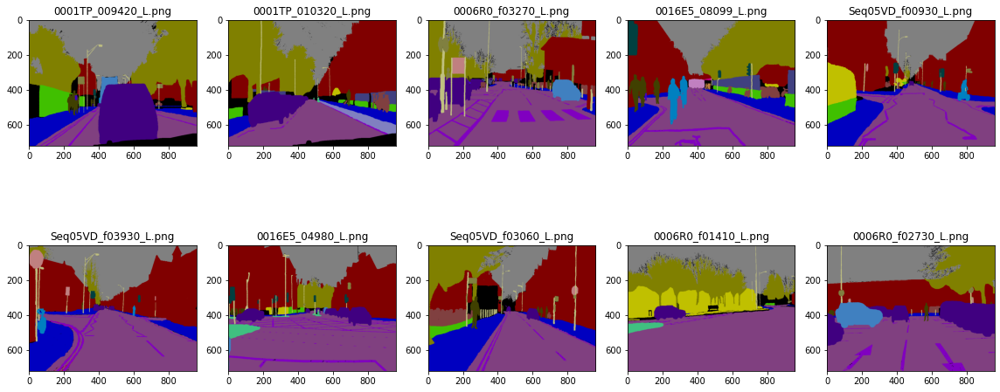

In [20]:
x = pluto.draw_batch(pluto.df_camvid.mask_name, is_shuffle=True)

In [32]:
@add_method(PacktDataAug)
def _make_batch_segmentation(self,df, disp_max=8,is_shuffle=False):
  # get random or not
  if (is_shuffle):
    _fns = df.sample(disp_max)
    _fns.reset_index(drop=True, inplace=True)
  else:
    _fns = df.head(disp_max)

  # merge the list
  fname = []
  fmask = []
  for i in range(disp_max):
    fname.append(str(_fns.fname[i]))
    fname.append(str(_fns.mask_name[i]))
    #
    fmask.append(str(pathlib.Path(_fns.fname[i]).name))
    fmask.append('Mask: ' +str(pathlib.Path(_fns.mask_name[i]).name))
  #
  return fname, fmask
#
@add_method(PacktDataAug)
def draw_batch_segmentation(self,df, disp_max=8,is_shuffle=False, figsize=(16,8), disp_col=4):
  disp_row = int(numpy.round((disp_max/disp_col)+0.4, 0))
  #
  fname, fmask = self._make_batch_segmentation(df, disp_max,is_shuffle)
  canvas, pic = matplotlib.pyplot.subplots(disp_row,disp_col, figsize=figsize)
  #
  _pics = pic.flatten()
  # display it
  for i, ax in enumerate(_pics):
    try:
      im = PIL.Image.open(fname[i])
      ax.imshow(im)
      ax.set_title(fmask[i])
    except:
      self._pp("Error, invalid image", fname[i])
  canvas.tight_layout()
  self._drop_image(canvas)
  canvas.show()
  return 

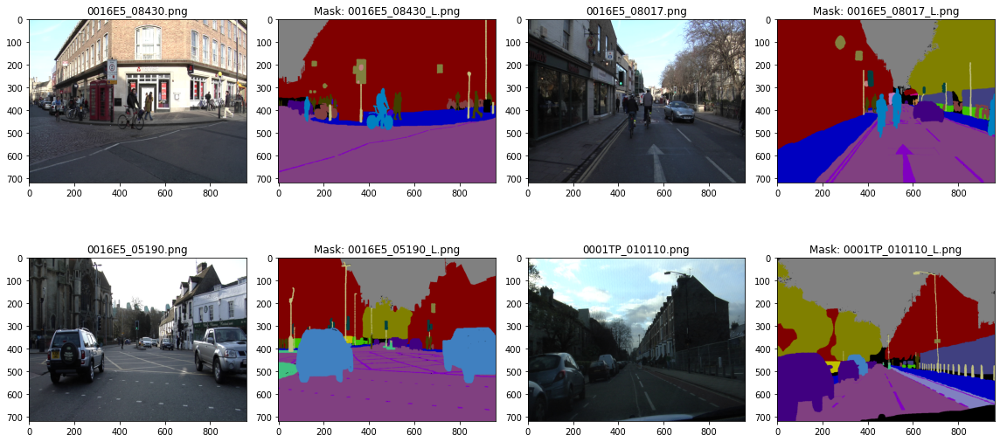

In [34]:
pluto.draw_batch_segmentation(pluto.df_camvid, is_shuffle=True)

## Semantic segmentation of aerial imagery

In [23]:
url = 'https://www.kaggle.com/datasets/humansintheloop/semantic-segmentation-of-aerial-imagery'
pluto.fetch_kaggle_dataset(url)

100%|██████████| 29.6M/29.6M [00:00<00:00, 64.9MB/s]


In [24]:
# remove white space in directory and filename
# run this until no error/output
f = 'kaggle/semantic-segmentation-of-aerial-imagery'
!find {f} -name "* *" -type d | rename 's/ /_/g'
#!find {f} -name "* *" -type f | rename 's/ /_/g'

Can't rename kaggle/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 4 kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_4: No such file or directory
Can't rename kaggle/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 7 kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_7: No such file or directory
Can't rename kaggle/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 3 kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_3: No such file or directory
Can't rename kaggle/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 6 kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6: No such file or directory
Can't rename kaggle/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 8 kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_da

In [25]:
# remove white space in directory and filename
# run this until no error/output
f = 'kaggle/semantic-segmentation-of-aerial-imagery'
!find {f} -name "* *" -type d | rename 's/ /_/g'
#!find {f} -name "* *" -type f | rename 's/ /_/g'

In [26]:
!rm kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/classes.json

In [27]:
pluto.df_aerial = pluto.make_dir_dataframe(f)
pluto.df_aerial.head()

,fname,label
0,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_001.png,masks
1,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_003.png,masks
2,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_004.png,masks
3,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_005.png,masks
4,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_002.png,masks


In [28]:
@add_method(PacktDataAug)
def _make_df_mask_name_aerial(self,fname):
  p = pathlib.Path(fname)
  return (str(p.parent.parent) + '/masks/' + str(p.stem) + '.png')
#
@add_method(PacktDataAug)
def make_df_mask_name_aerial(self,df):
  i = df[df['label'] =='masks'].index
  df.drop(i, inplace=True)
  df.reset_index(drop=True, inplace=True)
  df['mask_name'] = df.fname.apply(self._make_df_mask_name_aerial)
  return

In [29]:
pluto.make_df_mask_name_aerial(pluto.df_aerial)
pluto.df_aerial.head(3)

,fname,label,mask_name
0,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/images/image_part_001.jpg,images,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_001.png
1,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/images/image_part_002.jpg,images,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_002.png
2,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/images/image_part_007.jpg,images,kaggle/semantic-segmentation-of-aerial-imagery/Semantic_segmentation_dataset/Tile_6/masks/image_part_007.png


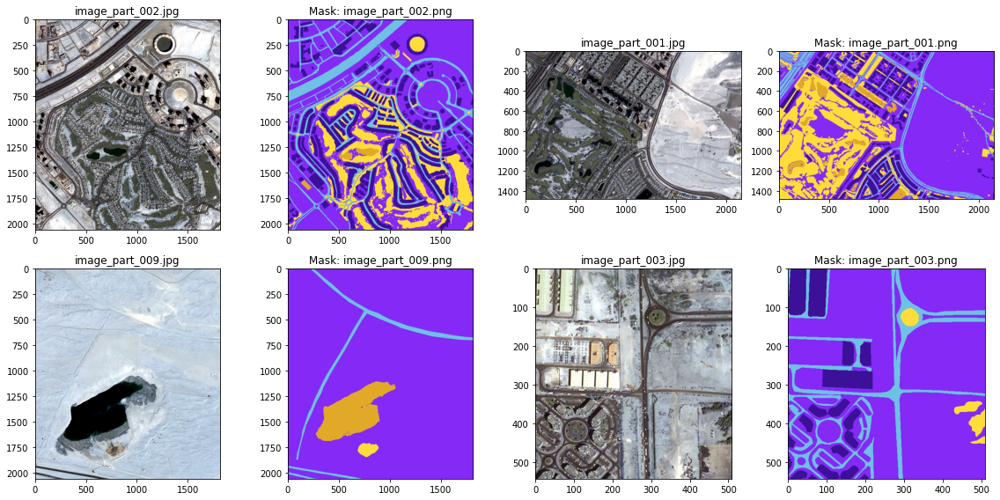

In [37]:
pluto.draw_batch_segmentation(pluto.df_aerial, is_shuffle=True)

# Geometric transformations filters 

In [52]:
@add_method(PacktDataAug)
def draw_image_flip_pil_segmen(self,fname):
  img = PIL.Image.open(fname)
  mirror_img = PIL.ImageOps.mirror(img)
  canvas, pic = matplotlib.pyplot.subplots(1,2, figsize=(16,6))
  #display(img, mirror_img)
  pic[0].imshow(img)
  pic[0].set_title(pathlib.Path(fname).name)
  pic[1].imshow(mirror_img)
  pic[1].set_title('Horizontal Flip')
  #
  canvas.tight_layout()
  self._drop_image(canvas)
  canvas.show()
  return

## Horizontal flip

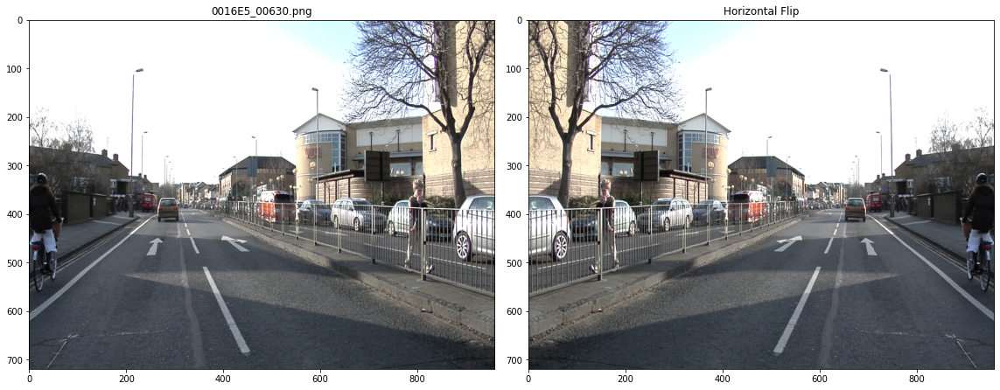

In [41]:
pluto.draw_image_flip_pil_segmen(pluto.df_camvid.fname[0])

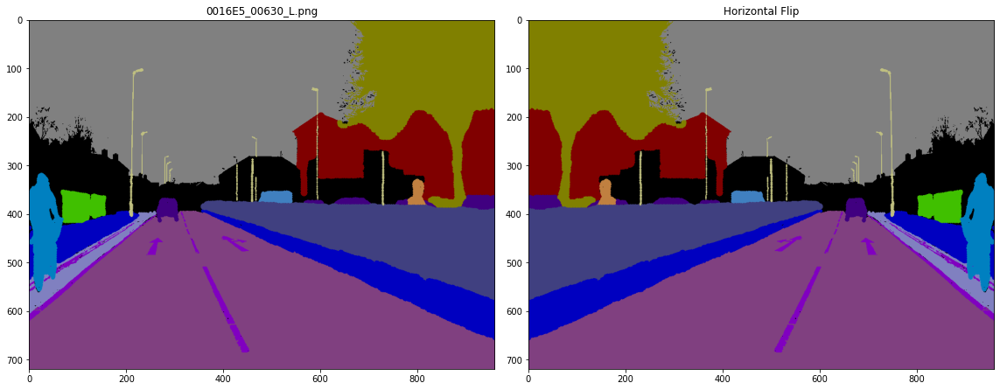

In [42]:
pluto.draw_image_flip_pil_segmen(pluto.df_camvid.mask_name[0])

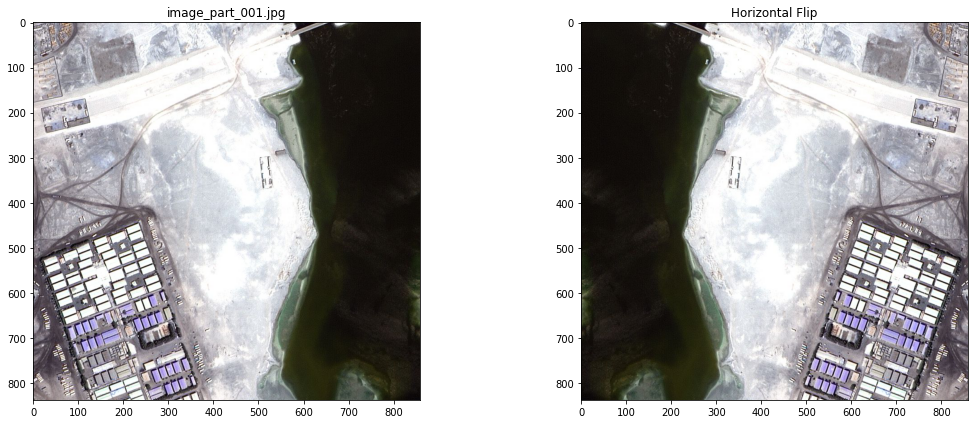

In [43]:
pluto.draw_image_flip_pil_segmen(pluto.df_aerial.fname[0])

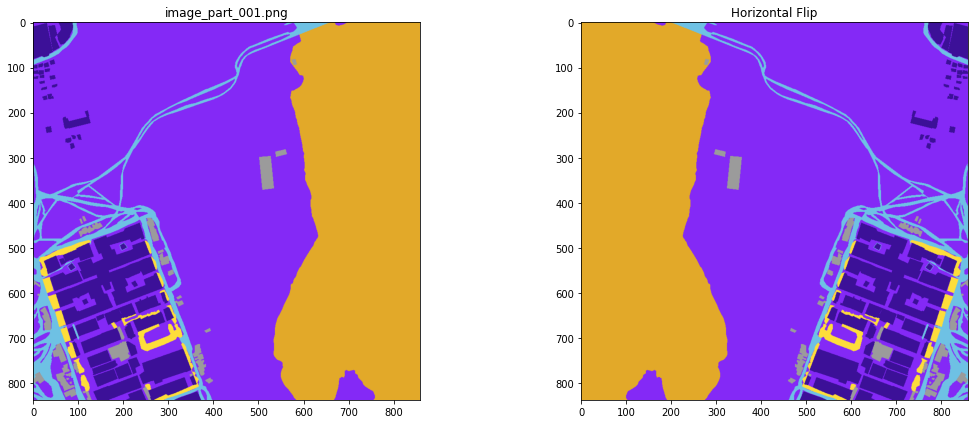

In [44]:
pluto.draw_image_flip_pil_segmen(pluto.df_aerial.mask_name[0])

In [63]:
@add_method(PacktDataAug)
def _draw_image_album_segmentation(self,df,aug_album,label_name):
  bsize = 2
  ncol = 4
  nrow = 2
  w = 18
  h = 8
  #
  canvas, pic = matplotlib.pyplot.subplots(nrow, ncol, figsize=(w, h))
  pics = pic.flatten()
  # select random images
  samp = df.sample(bsize)
  samp.reset_index(drop=True, inplace=True)
  #
  _img = []
  _label = []
  for i in range(2):
    img = PIL.Image.open(samp.fname[i])
    imask = PIL.Image.open(samp.mask_name[i])
    _img.append(img)
    _img.append(imask)
    img_numpy = numpy.array(img)
    imask_numpy = numpy.array(imask)
    album = aug_album(image=img_numpy,mask=imask_numpy)
    _img.append(album['image'])
    _img.append(album['mask'])
    #
    _label.append(str(pathlib.Path(samp.fname[i]).name))
    _label.append('Mask:')
    _label.append(label_name)
    _label.append(label_name + ': Mask:')
  #
  for i, ax in enumerate(pics):
    ax.imshow(_img[i])
    ax.set_title(_label[i])
  canvas.tight_layout()
  self._drop_image(canvas)
  canvas.show()
  return

In [64]:
@add_method(PacktDataAug)
def draw_image_flip_segmen(self,df):
  aug_album = albumentations.HorizontalFlip(p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Horizontal Flip')
  return

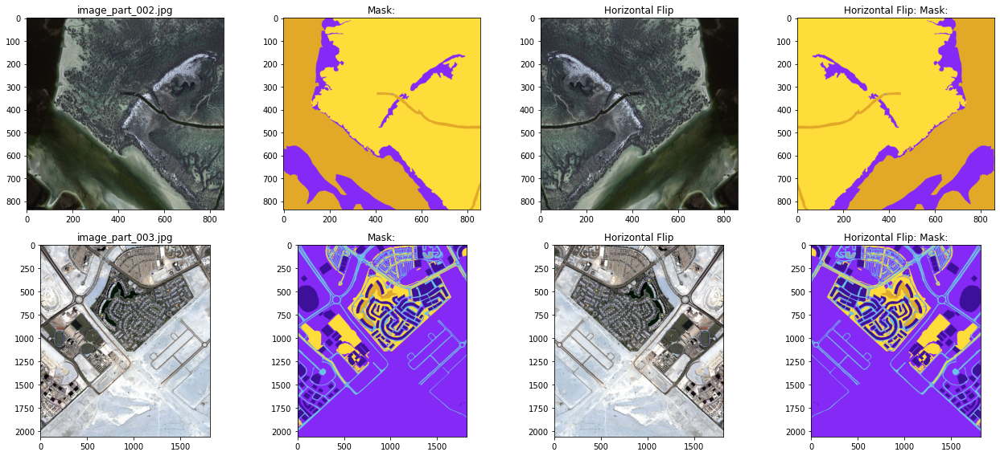

In [65]:
pluto.draw_image_flip_segmen(pluto.df_aerial)

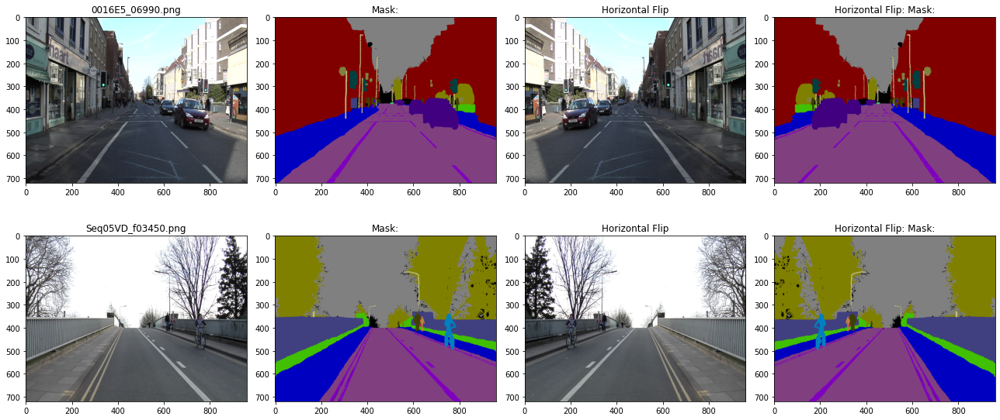

In [67]:
pluto.draw_image_flip_segmen(pluto.df_camvid)

## Vertical and horizontal flip

In [73]:
@add_method(PacktDataAug)
def draw_image_flip_both_segmen(self,df):
  aug_album = albumentations.Flip(p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Vertical Flip')
  return

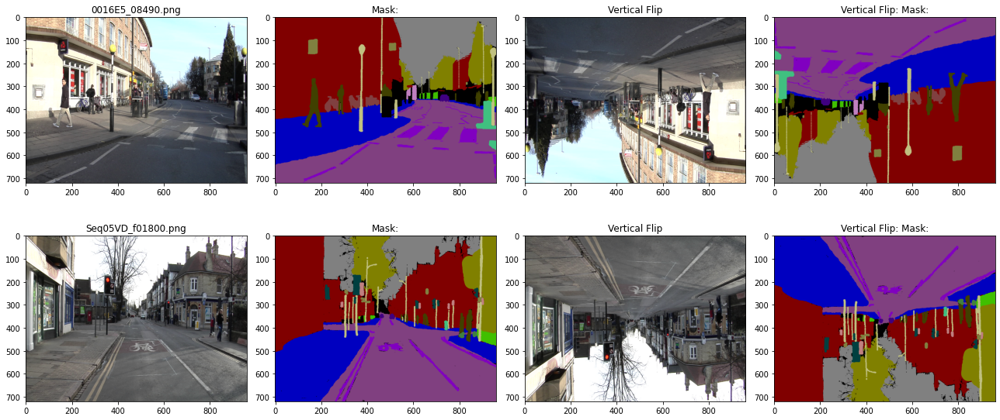

In [70]:
pluto.draw_image_flip_both_segmen(pluto.df_camvid)

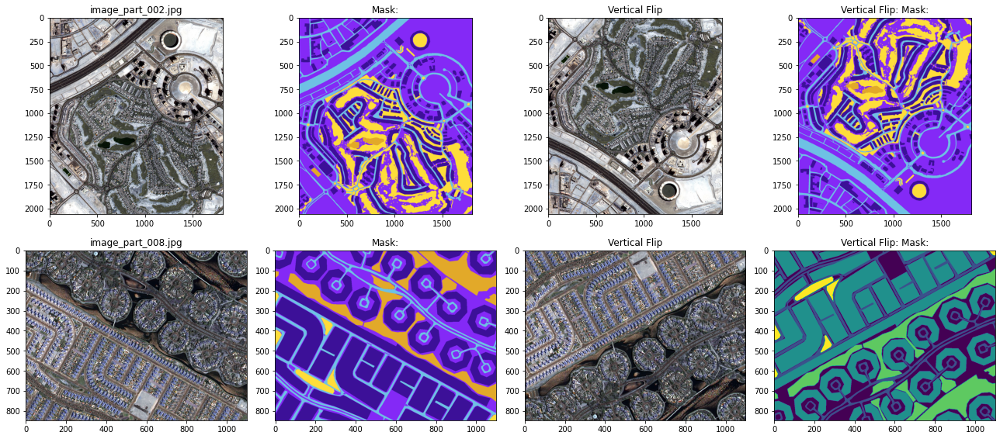

In [72]:
pluto.draw_image_flip_both_segmen(pluto.df_aerial)

## Rotating

In [42]:
# albumentations.Rotate?

In [74]:
@add_method(PacktDataAug)
def draw_image_rotate_segmen(self,df):
  aug_album = albumentations.Rotate(limit=45, p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Rotate')
  return

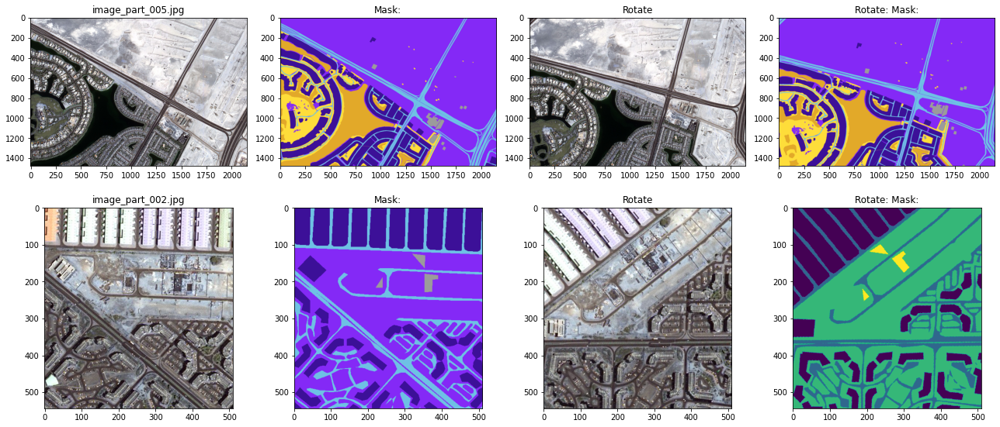

In [78]:
pluto.draw_image_rotate_segmen(pluto.df_aerial)

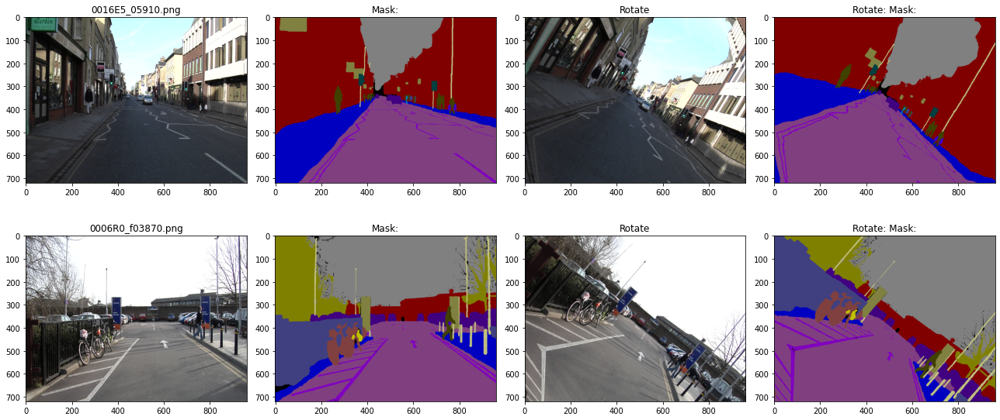

In [79]:
pluto.draw_image_rotate_segmen(pluto.df_camvid)

## Random Resize and Crop

In [46]:

@add_method(PacktDataAug)
def draw_image_resize_segmen(self,df):
  aug_album = albumentations.RandomSizedCrop(min_max_height=(500, 600), height=500, width=500, p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Resize')
  return

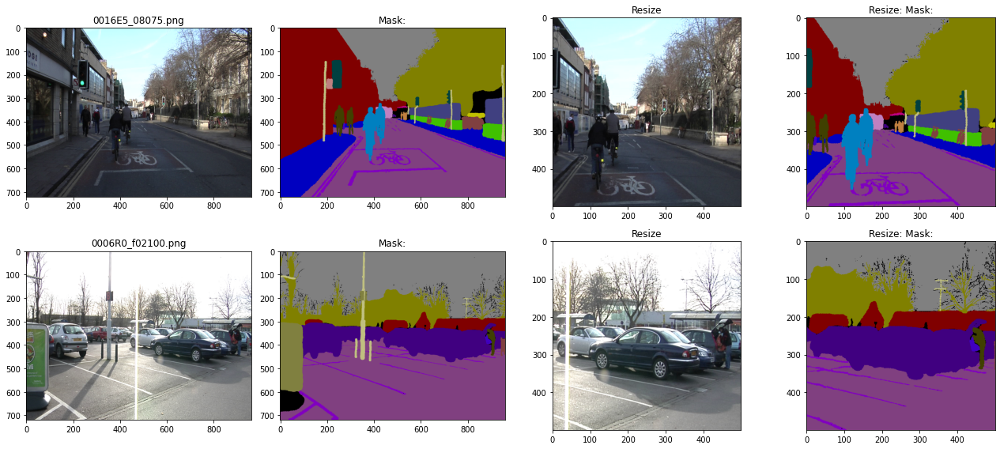

In [47]:
pluto.draw_image_resize_segmen(pluto.df_camvid)

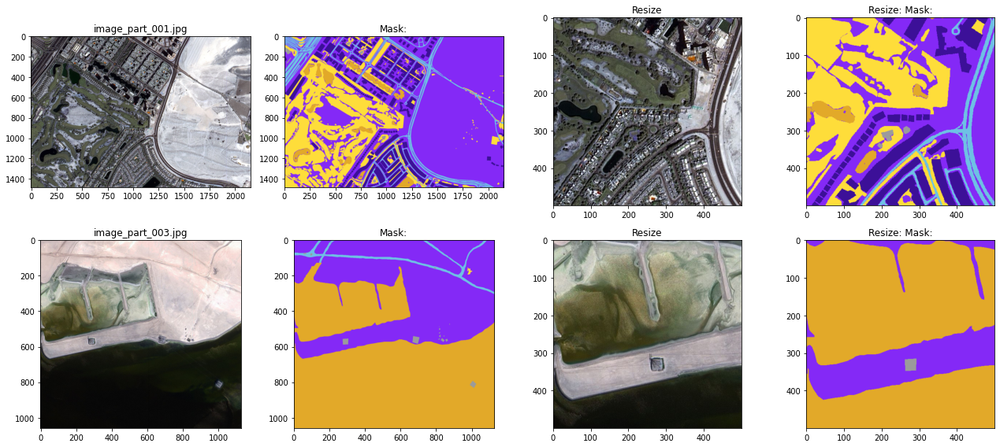

In [49]:
pluto.draw_image_resize_segmen(pluto.df_aerial)

## Transpose

In [51]:
@add_method(PacktDataAug)
def draw_image_transpose_segmen(self,df):
  aug_album = albumentations.Transpose(p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Transpose')
  return

In [50]:
# albumentations.Transpose?

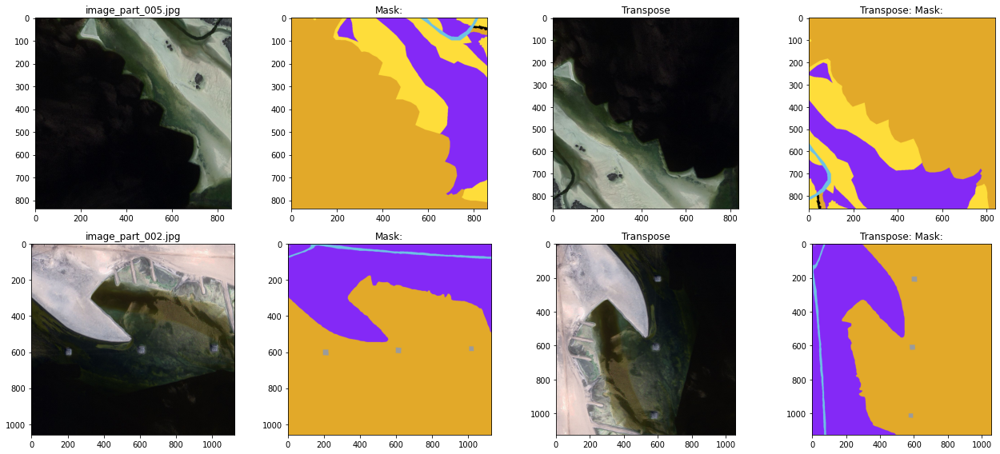

In [55]:
pluto.draw_image_transpose_segmen(pluto.df_aerial)

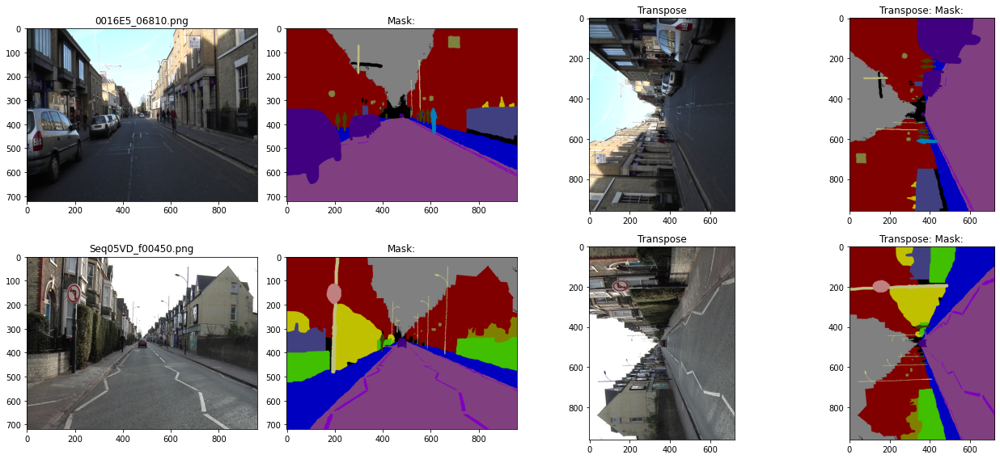

In [53]:
pluto.draw_image_transpose_segmen(pluto.df_camvid)

# Photometric transformations

## Lighting

In [56]:
@add_method(PacktDataAug)
def draw_image_brightness_segmen(self,df,brightness=0.5):
  aug_album = albumentations.ColorJitter(brightness=brightness,
    contrast=0.0, saturation=0.0,hue=0.0,always_apply=True, p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Brightness')
  return

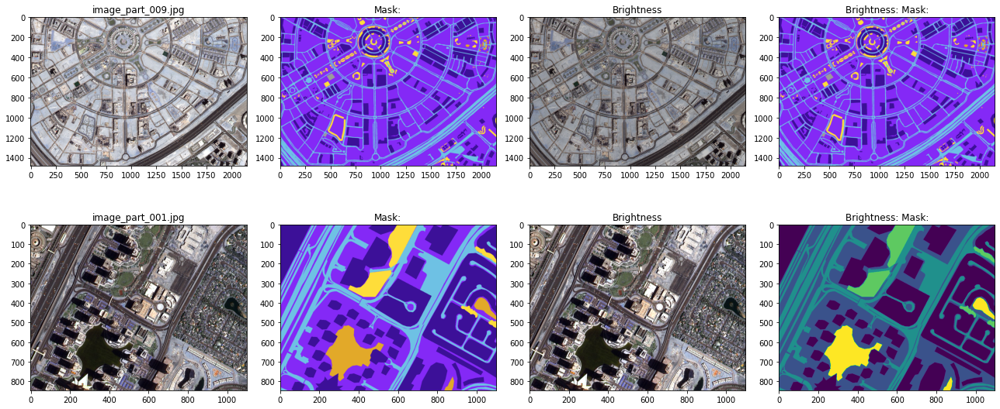

In [58]:
pluto.draw_image_brightness_segmen(pluto.df_aerial)

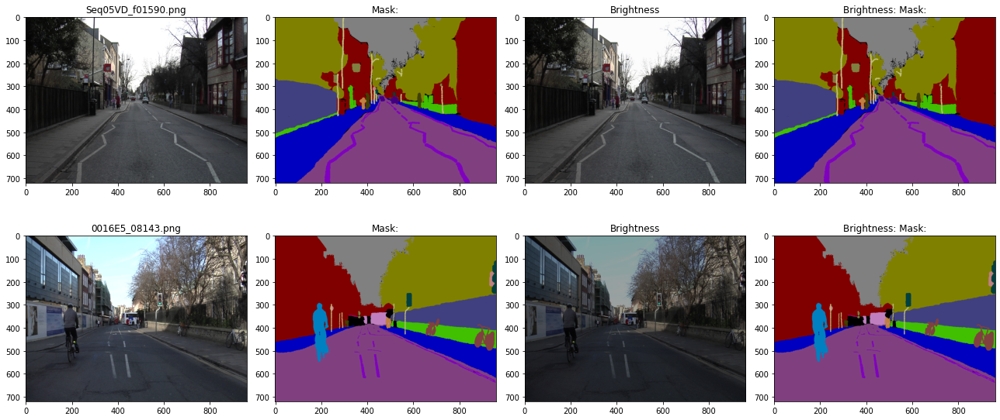

In [59]:
pluto.draw_image_brightness_segmen(pluto.df_camvid)

## Grayscale (Not applicable for segmentation)


In [ ]:
# @add_method(PacktDataAug)
# def draw_image_grayscale(self,df,bsize=5):
#   aug_album = albumentations.ToGray(p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Contrast

In [61]:
@add_method(PacktDataAug)
def draw_image_contrast_segmen(self,df,contrast=0.5):
  aug_album = albumentations.ColorJitter(brightness=0.0,
    contrast=contrast, saturation=0.0,hue=0.0,always_apply=True, p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'Contrast')
  return

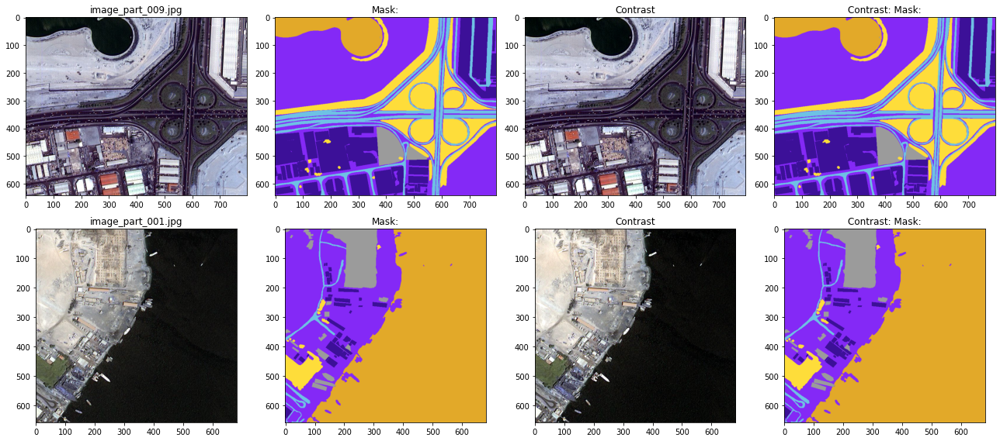

In [62]:
pluto.draw_image_contrast_segmen(pluto.df_aerial)

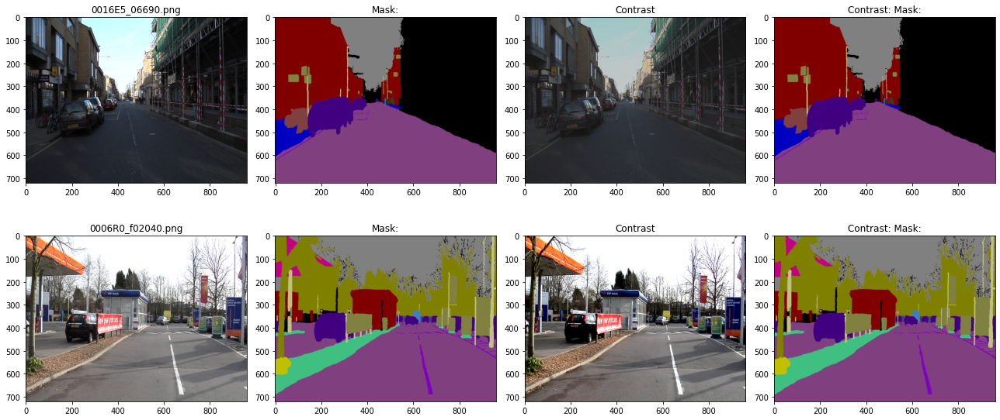

In [63]:
pluto.draw_image_contrast_segmen(pluto.df_camvid)

## saturation (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_saturation(self,df,saturation=0.2,bsize=5):
#   aug_album = albumentations.ColorJitter(brightness=0.0,
#     contrast=0.0, saturation=saturation,hue=0.0,always_apply=True, p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Hue Shifting (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_hue(self,df,hue=0.2,bsize=5):
#   aug_album = albumentations.ColorJitter(brightness=0.0,
#     contrast=0.0, saturation=0.0,hue=hue,always_apply=True, p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Noise Injection (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_noise(self,df,var_limit=(10.0, 50.0),bsize=5):
#   aug_album = albumentations.GaussNoise(var_limit=var_limit,
#     always_apply=True, p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Snow (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_snow(self,df,snow_point_lower=0.1,snow_point_upper=0.3,bsize=2,brightness_coeff=2.5):
#   aug_album = albumentations.RandomSnow(snow_point_lower=snow_point_lower,
#     snow_point_upper = snow_point_upper, always_apply=True, p=1.0,brightness_coeff=brightness_coeff)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Sunflare (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_sunflare(self,df,flare_roi=(0, 0, 1, 0.5),src_radius=400,bsize=2):
#   aug_album = albumentations.RandomSunFlare(flare_roi=flare_roi,
#     src_radius=src_radius, always_apply=True, p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Rain (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_rain(self,df,drop_length=20, drop_width=1,blur_value=1,bsize=2):
#   aug_album = albumentations.RandomRain(drop_length=drop_length, drop_width=drop_width,
#     blur_value=blur_value,always_apply=True, p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## Sepia (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_sepia(self,df,bsize=5):
#   aug_album = albumentations.ToSepia(always_apply=True, p=1.0)
#   self._draw_image_album(df,aug_album,bsize)
#   return

## FancyPCA (Not applicable for segmentation)

In [68]:
@add_method(PacktDataAug)
def draw_image_fancyPCA_segmen(self,df,alpha=0.3):
  aug_album = albumentations.FancyPCA(alpha=alpha, always_apply=True, p=1.0)
  self._draw_image_album_segmentation(df,aug_album,'FancyPCA')
  return

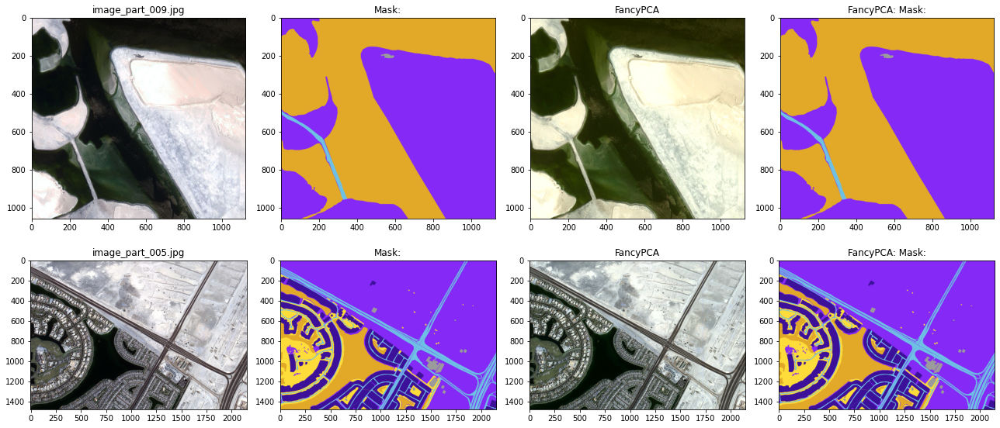

In [69]:
pluto.draw_image_fancyPCA_segmen(pluto.df_aerial)

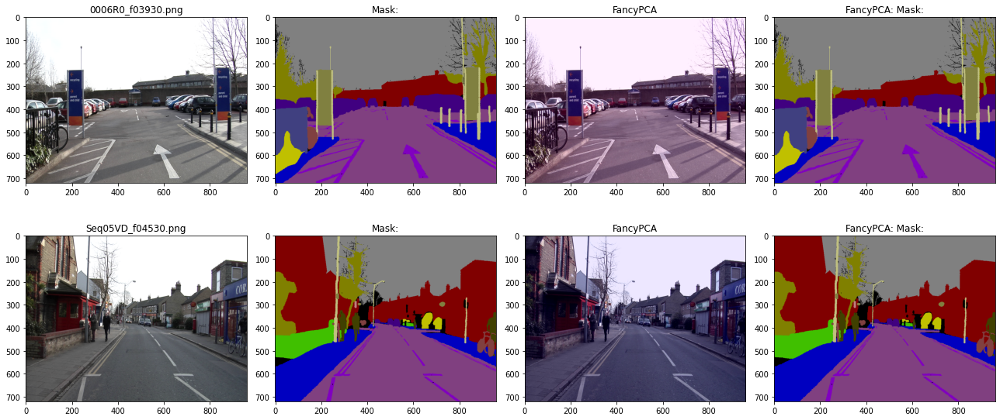

In [70]:
pluto.draw_image_fancyPCA_segmen(pluto.df_camvid)

# Random Erasing (Not applicable for segmentation)

In [ ]:
# @add_method(PacktDataAug)
# def draw_image_erasing(self,df,bsize=8,max_count=5):
#   aug = [fastai.vision.augment.RandomErasing(p=1.0,max_count=max_count)]
#   itfms = fastai.vision.augment.Resize(480)
#   dsl_org = self._make_data_loader(df, aug,itfms)
#   dsl_org.show_batch(max_n=bsize)
#   return dsl_org

# Combination

In [ ]:
#

## draw table

In [ ]:
@add_method(PacktDataAug)
def print_safe_parameters(self):
  data = [['Horizontal Flip','NA','Yes','Yes','Yes','Yes','Yes',],
    ['Vertical Flip','NA','NA','NA','Yes','Yes','NA',],
    ['Croping and Padding','NA','pad=border','pad=border','pad=reflection','pad=reflection','pad=zeros',],
    ['Rotation','NA','max_rotate=25.0','max_rotate=25.0','max_rotate=180.0','max_rotate=180.0','max_rotate=16.0',],
    ['Warping','NA','magnitude=0.3','magnitude=0.3','magnitude=0.4','magnitude=0.4','magnitude=0.3',],
    ['Lighting','brightness=0.2','brightness=0.3','brightness=0.3','brightness=0.4','brightness=0.4','brightness=0.3',],
    ['Grayscale','NA','NA','NA','NA','NA','Yes',],
    ['Contrast','contrast=0.1','contrast=0.3','contrast=0.3','contrast=0.3','contrast=0.4','contrast=0.4',],
    ['Saturation','NA','saturation=3.5','saturation=2.0','saturation=3.0','saturation=3.0','saturation=2.5',],
    ['Hue Shifting','NA','NA','NA','hue=0.15','hue=0.2','hue=0.2',],
    ['Noise Injection','limit=(100.0, 300.0)','limit=(300.0, 500.0)','limit=(200.0, 400.0)','limit=(200.0, 400.0)','limit=(300.0, 400.0)','limit=(300.0, 500.0)',],
    ['Sun Flare','NA','NA','radius=200','NA','NA','NA',],
    ['Rain','NA','NA','length=20','NA','NA','NA',],
    ['Sepia','NA','Yes','NA','NA','NA','NA',],
    ['FancyPCA','NA','alpha=0.5','alpha=0.5','alpha=0.5','alpha=0.5','NA',],
    ['Random Erasing','NA','max_count=3','max_count=3','max_count=4','max_count=4','NA',]]
  # Create the pandas DataFrame
  df = pandas.DataFrame(data, columns=['CamVid','CamVid Mask', 'Aerial', 'Aerial Mask'])
  display(df)
  return

In [ ]:
pluto.print_safe_parameters()

,Filter,Covid-19,People,Fungi,Sea Animal,Food,Mall Crowd
0,Horizontal Flip,NA,Yes,Yes,Yes,Yes,Yes
1,Vertical Flip,NA,NA,NA,Yes,Yes,NA
2,Croping and Padding,NA,pad=border,pad=border,pad=reflection,pad=reflection,pad=zeros
3,Rotation,NA,max_rotate=25.0,max_rotate=25.0,max_rotate=180.0,max_rotate=180.0,max_rotate=16.0
4,Warping,NA,magnitude=0.3,magnitude=0.3,magnitude=0.4,magnitude=0.4,magnitude=0.3
5,Lighting,brightness=0.2,brightness=0.3,brightness=0.3,brightness=0.4,brightness=0.4,brightness=0.3
6,Grayscale,NA,NA,NA,NA,NA,Yes
7,Contrast,contrast=0.1,contrast=0.3,contrast=0.3,contrast=0.3,contrast=0.4,contrast=0.4
8,Saturation,NA,saturation=3.5,saturation=2.0,saturation=3.0,saturation=3.0,saturation=2.5
9,Hue Shifting,NA,NA,NA,hue=0.15,hue=0.2,hue=0.2


## draw augment covid-19

In [ ]:
class AlbumentationsTransform(DisplayedTransform):
  split_idx,order=0,2
  def __init__(self, train_aug): store_attr()
  
  def encodes(self, img: fastai.vision.core.PILImage):
    aug_img = self.train_aug(image=numpy.array(img))['image']
    return fastai.vision.core.PILImage.create(aug_img)
#
# def get_train_aug(): return albumentations.Compose([
#   #albumentations.HueSaturationValue(
#       #hue_shift_limit=0.2, 
#       #sat_shift_limit=0.2, 
#       #val_shift_limit=0.2, 
#       #p=0.5
#   #),
#   albumentations.ColorJitter(brightness=0.2,
#     contrast=0.0, saturation=0.0,hue=0.0,p=0.5)
# ])

In [ ]:
@add_method(PacktDataAug)
def _fetch_album_covid19(self):
  return albumentations.Compose([
  albumentations.GaussNoise(var_limit=(100.0, 300.0), p=0.5)
  ])
#
@add_method(PacktDataAug)
def draw_augment_covid19(self,df,bsize=15):
  aug = [
    fastai.vision.augment.Brightness(max_lighting=0.3,p=0.5),
    fastai.vision.augment.Contrast(max_lighting=0.4, p=0.5),
    AlbumentationsTransform(self._fetch_album_covid19())
    ]
  itfms = fastai.vision.augment.Resize(480)
  dsl_org = self._make_data_loader(df, aug,itfms)
  dsl_org.show_batch(max_n=bsize)
  return dsl_org

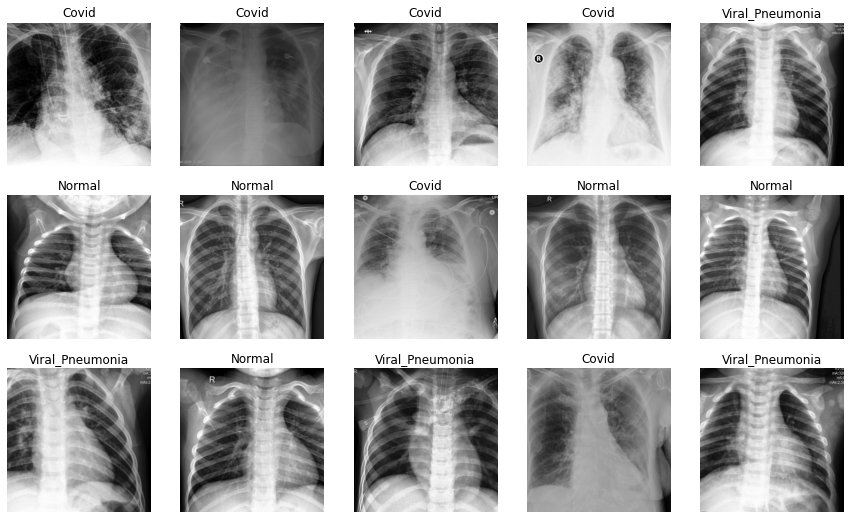

In [ ]:
pluto.dls_covid19 = pluto.draw_augment_covid19(pluto.df_covid19)

## Draw augment People

In [ ]:
@add_method(PacktDataAug)
def _fetch_album_people(self):
  return albumentations.Compose([
  albumentations.ColorJitter(brightness=0.3, contrast=0.4, saturation=3.5,hue=0.0, p=0.5),
  albumentations.ToSepia(p=0.5),
  albumentations.FancyPCA(alpha=0.5, p=0.5),
  albumentations.GaussNoise(var_limit=(300.0, 500.0), p=0.5)
  ])
#
@add_method(PacktDataAug)
def draw_augment_people(self,df,bsize=15):
  aug = [
    fastai.vision.augment.Flip(p=0.5),
    fastai.vision.augment.Rotate(25.0,p=0.5,pad_mode='border'),
    fastai.vision.augment.Warp(magnitude=0.3, pad_mode='border',p=0.5),
    fastai.vision.augment.RandomErasing(p=0.5,max_count=2),
    AlbumentationsTransform(self._fetch_album_people())
    ]
  itfms = fastai.vision.augment.Resize(480)
  dsl_org = self._make_data_loader(df, aug,itfms)
  dsl_org.show_batch(max_n=bsize)
  return dsl_org

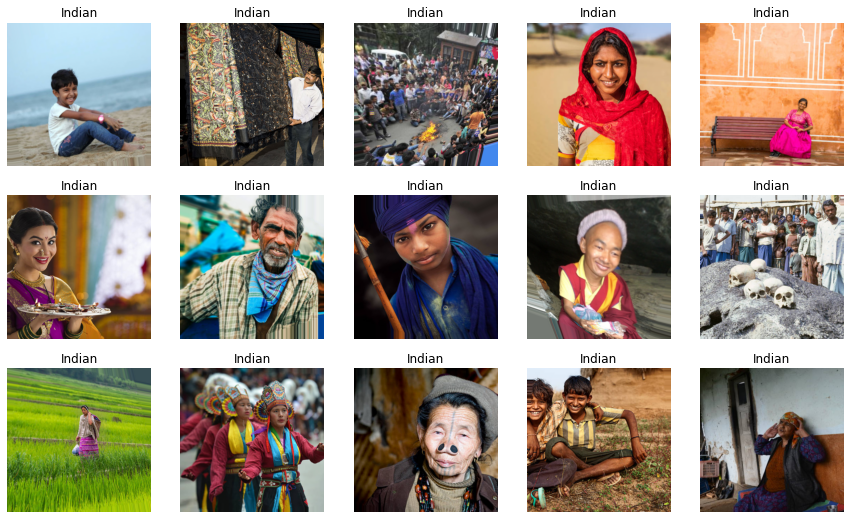

In [ ]:
pluto.dls_people = pluto.draw_augment_people(pluto.df_people)

# Push up all changes (delete after complete)

- username: duchaba

- password: [use the token]

In [ ]:
f = '/content/Data-Augmentation-with-Python'
!git add -A
!git config --global user.email "duc.haba@gmail.com"
!git config --global user.name "duchaba"
!git commit -m "end of session, export .py file"

In [ ]:
#use the xterm
#git push

# Summary 

Every chaper will begin with same base class "PacktDataAug".

✋ FAIR WARNING:

- The coding uses long and complete function path name.

- Pluto wrote the code for easy to understand and not for compactness, fast execution, nor cleaverness.

- Use Xterm to debug cloud server



In [ ]:
!pip install colab-xterm
%load_ext colabxterm
%xterm